### Laboratorium 4, cześć 2: Transformacja Hougha

#### _Fabuła_
_Budujemy aplikację do szkolenia snookerzystów. Jej celem będzie, między innymi, analiza pozycji i sugerowanie zagrań. Naturalnie, podstawą działania aplikacji musi być funkcjonalność detekcji bil i określenia ich pozycji w układzie współrzędnych stołu. W dalszych etapach określane będą geometryczne relacje między bilami i łuzami - ich implementacją zajmie się jednak inny zespół._

#### Zadanie
Twoim celem będzie wykonanie detekcji **bil** oraz **band** za pomocą transformacji Hougha.
Przygotujesz potok przetwarzania przyjmujący obraz kolorowy w przestrzeni BGR/RGB a zwracający dwie kolekcje: jedną reprezentującą okręgi (bile), drugą - linie/odcinki (bandy) lub punkty (narożniki stołu).
Format tych kolekcji jest dowolny, szczegóły implementacji potoku podobnie.
W ogólności, potok powinien składać się z:
* etapu przetwarzania wstępnego - skorzystaj ze swojego ulubionego detektora krawędzi,
* wykonania transformacji Hougha dla linii ([`cv2.HoughLines`](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga0b7ee275f89bb1a799ab70a42131f39d)) do wykrycia band,
* wykonania transformacji Hougha dla okręgów ([`cv2.HoughCircles`](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga47849c3be0d0406ad3ca45db65a25d2d)) do wykrycia bil,
* przetwarzania końcowego wyników transformacji (np. usunięcie nadmiarowych/fałszywych detekcji).

Zaimplementuj również funkcję prezentującą wyniki w formie wizualnej, tj. rysującej wykryte obiekty na kopii obrazu wejściowego.

Dane są cztery obrazy.
Staraj się prowadzić eksperymenty na jednym czy dwóch, a następnie zaprezentować wyniki na pozostałych.

#### Oczekiwane rezultaty
1. Zacznij od znalezienia odpowiednich parametrów detektora krawędzi - jeśli na tym etapie wyniki będą słabe, to dalej będzie tylko gorzej (_garbage-in, garbage-out_). Nie skupiaj się na badaniu ich wpływu na wyniki końcowe, a jedynie przedstaw efekt przetwarzania wstępnego, tj. jak wygląda obraz, na którym wykonywana będzie TH. Ta część zadania będzie oceniana binarnie: dobrze/źle.
2. Kalibracja parametrów transformacji Hougha: zadanie **NIE** polega na zrobieniu grid searchu po parametrach TH (wykonanie go nie jest _zabronione_, po prostu nie umieszczaj go w notatniku). Interesujące jest jedynie zrozumienie działania poszczególnych parametrów i ich wpływu na wyniki - pozostaw w notatniku jedynie kilka przykładowych wyników, takich które ilustrują dokonane przez Ciebie wybory parametrów (_ustawiam parametr $x$ na wartość $x_0$, bo przy wartości $x_1$ działo się tak a tak_).
3. Demonstracja wyników na pozostałych obrazach: przedstaw obraz wejściowy, wykryte krawędzie, wykryte obiekty. Efektem powinny być 4 (lub 6) linii reprezentujących bandy, oraz zbiór okręgów odpowiadających bilom (w idealnym przypadku 1:1, ale nie musisz poświęcać długich godzin na wyeliminowaniu _wszystkich_ błędów, ważniejsze jest by umieć wyjaśnić, skąd się wzięły).


#### Literatura
1. Dokumentacja funkcji([`cv2.HoughLines`](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga0b7ee275f89bb1a799ab70a42131f39d)) i ([`cv2.HoughCircles`](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga47849c3be0d0406ad3ca45db65a25d2d)) - działanie parametrów jest bardzo dobrze opisane.
2. Jeśli chcesz poznać TH "od środka" - [tutaj](https://medium.com/@alb.formaggio/implementing-the-hough-transform-from-scratch-09a56ba7316b) ktoś zaimplementował ją od zera. Czytając, uważaj tylko, by nie powtórzyć po Alberto jego błędu (krawędzie!)
3. Źródło danych do zadania: kompilacja [TOP 40 SHOTS of 2025 British Open](https://www.youtube.com/watch?v=5oZ3fIF9qog) autorstwa GTKomissaRa.

In [1]:
print("hello!")

hello!


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from lab4.hough_utils import (
    img_grad_val,
    display_lines,
    display_circles,
    extract_inner_edges,
    filter_circles_within_edges,
    process_image,
)

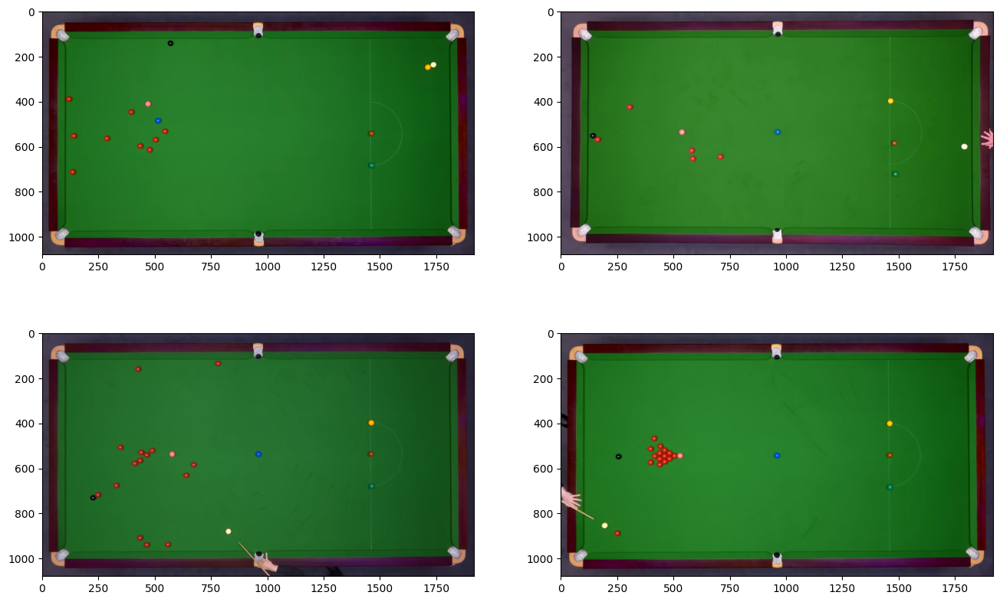

In [4]:
# zbiór danych
mcgill: np.ndarray = cv2.imread("lab4/dane/mcgill.png")  # type: ignore
trump: np.ndarray = cv2.imread("lab4/dane/trump.png")  # type: ignore
zhao: np.ndarray = cv2.imread("lab4/dane/zhao.png")  # type: ignore
mcgill2: np.ndarray = cv2.imread("lab4/dane/mcgill2.png")  # type: ignore
# tu wyświetlone są wszystkie naraz w pomniejszeniu
# w eksperymentach staraj się wyświetlać je w dużym rozmiarze (albo używaj RoI)
_, axes = plt.subplots(2, 2, figsize=(16, 10))
axes.ravel()[0].imshow(mcgill[..., ::-1])
axes.ravel()[1].imshow(trump[..., ::-1])
axes.ravel()[2].imshow(zhao[..., ::-1])
axes.ravel()[3].imshow(mcgill2[..., ::-1])

## Analiza Color Spaces 

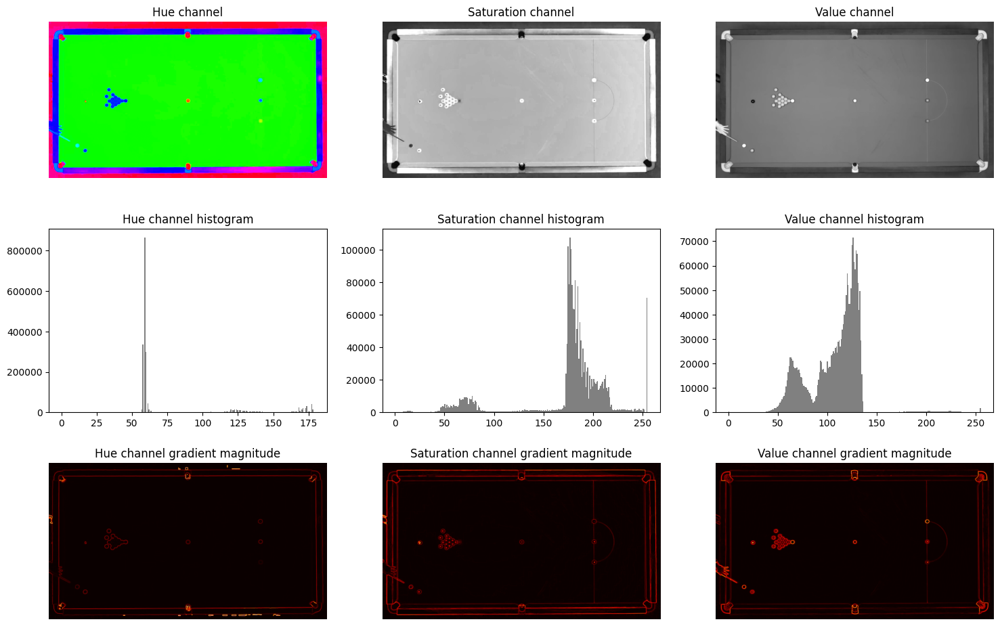

In [5]:
mcgill_hsv = cv2.cvtColor(mcgill2, cv2.COLOR_RGB2HSV)
fig, axs = plt.subplots(3, 3, figsize=(18, 12))
for i, ch in enumerate(["Hue", "Saturation", "Value"]):
    channel = mcgill_hsv[..., i]
    if i == 0:
        axs[0, i].imshow(channel, cmap="hsv")
    else:
        axs[0, i].imshow(channel, cmap="gray")

    axs[0, i].set_title(f"{ch} channel")
    axs[0, i].axis("off")

    axs[1, i].hist(channel.ravel(), bins=256, color="gray")
    axs[1, i].set_title(f"{ch} channel histogram")

    axs[2, i].imshow(img_grad_val(channel), cmap="hot")
    axs[2, i].set_title(f"{ch} channel gradient magnitude")
    axs[2, i].axis("off")

### Detekcja krawędzi (saturation HSV)

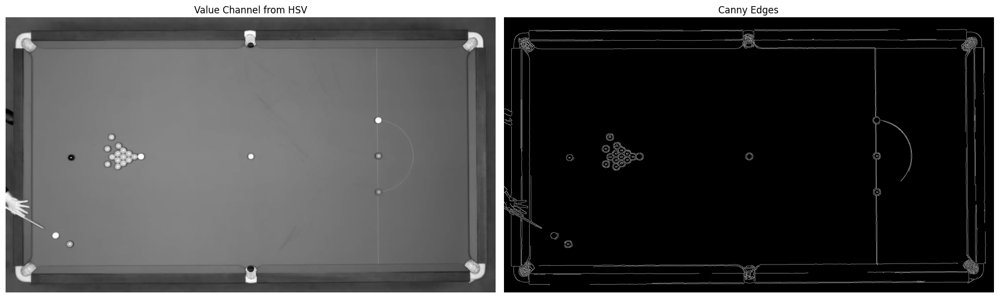

In [6]:
value_channel = mcgill_hsv[..., 2]

edges = cv2.Canny(value_channel, 20, 80, apertureSize=3)

fig, axs = plt.subplots(1, 2, figsize=(18, 12))

axs[0].imshow(value_channel, cmap="gray")
axs[0].set_title("Value Channel from HSV")
axs[0].axis("off")

axs[1].imshow(edges, cmap="gray")
axs[1].set_title("Canny Edges")
axs[1].axis("off")

plt.tight_layout()
plt.show()

## Rysujemy Linie!

za małe rho - wynik nawet fajny, ale nie da się usunąć nadmiaru linii bez tracenia prawej pionowej bandy.

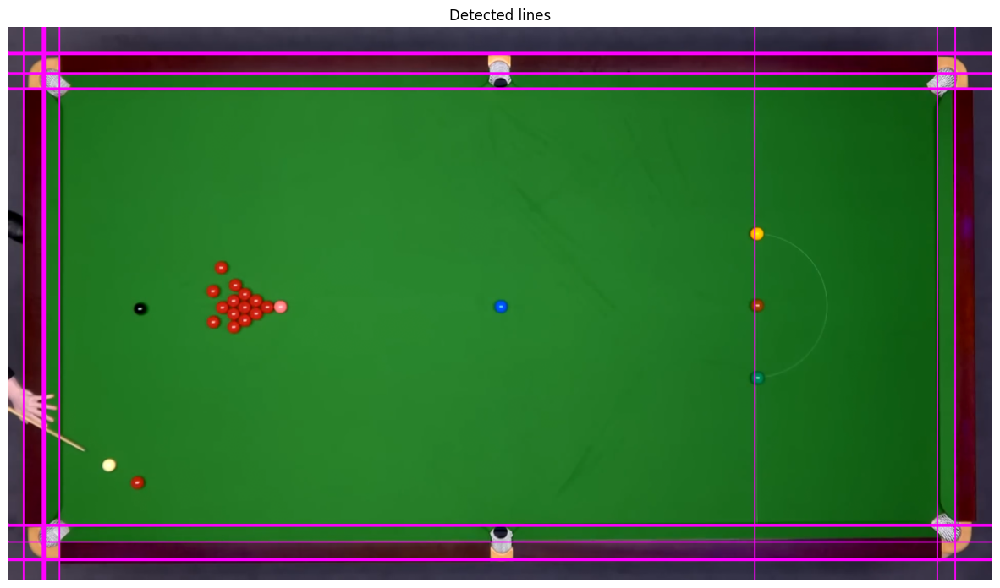

In [7]:
lines = cv2.HoughLines(edges, rho=1, theta=np.pi / 2, threshold=250)
display_lines(mcgill2, lines)

rho wydaje się mieć małe znaczenie, dostosowanie odpowiedniej thety oraz thresholdu jest możliwe dla barzo różnych rho

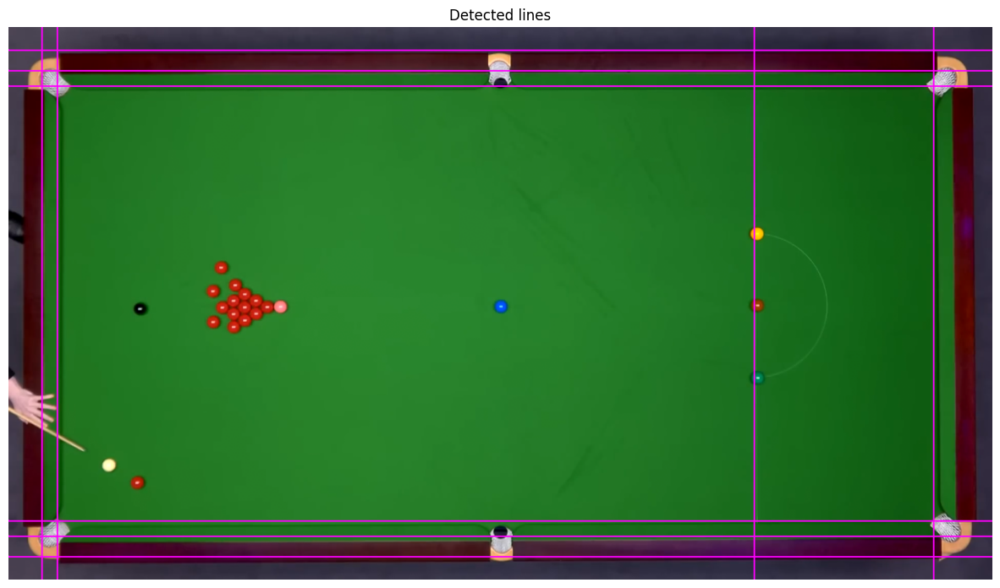

In [8]:
lines = cv2.HoughLines(edges, rho=10, theta=np.pi / 2, threshold=1400)
display_lines(mcgill2, lines)

za mały threshold

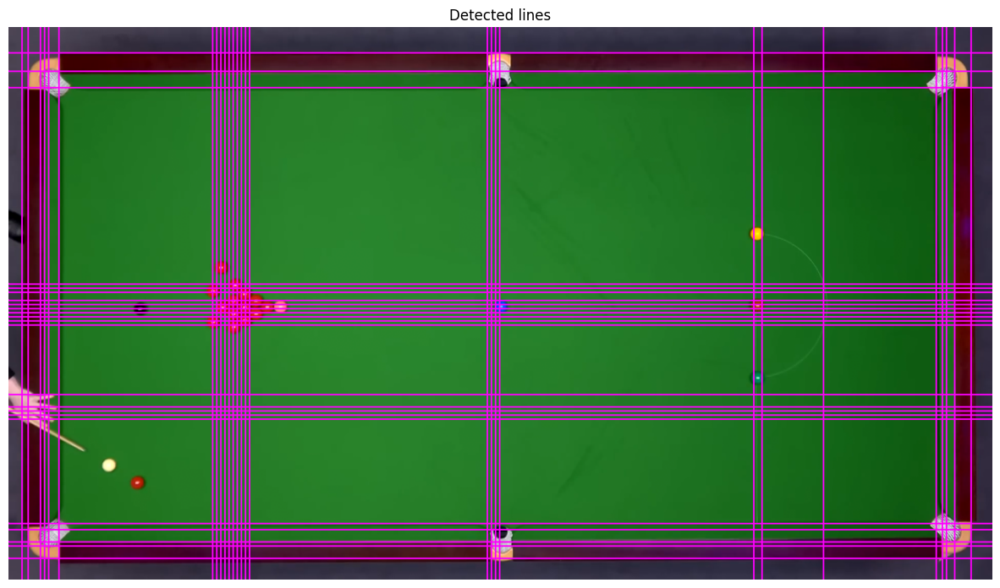

In [9]:
lines = cv2.HoughLines(edges, rho=4, theta=np.pi / 2, threshold=100)
display_lines(mcgill2, lines)

za duży threshold

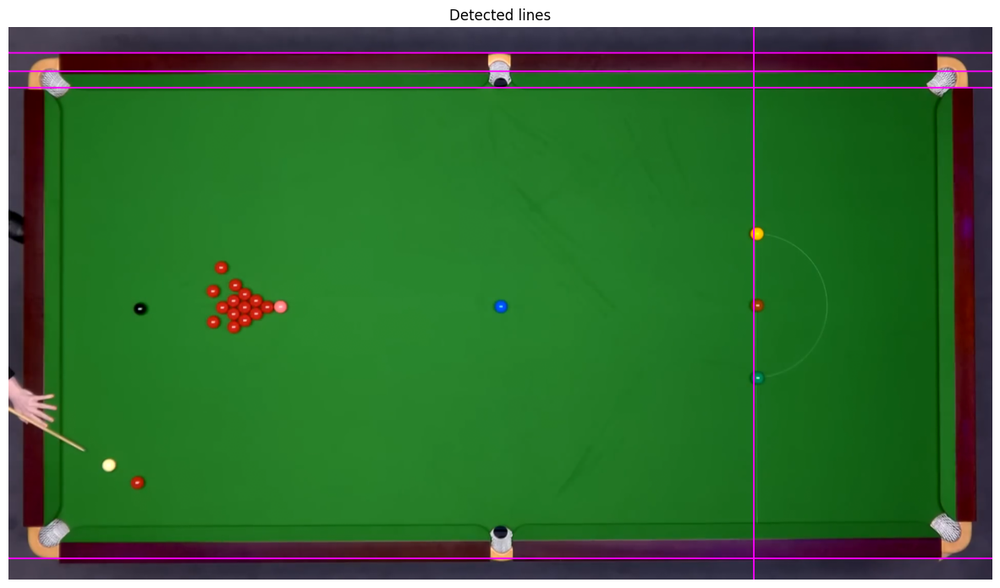

In [10]:
lines = cv2.HoughLines(edges, rho=4, theta=np.pi / 2, threshold=1000)
display_lines(mcgill2, lines)

za małe pi

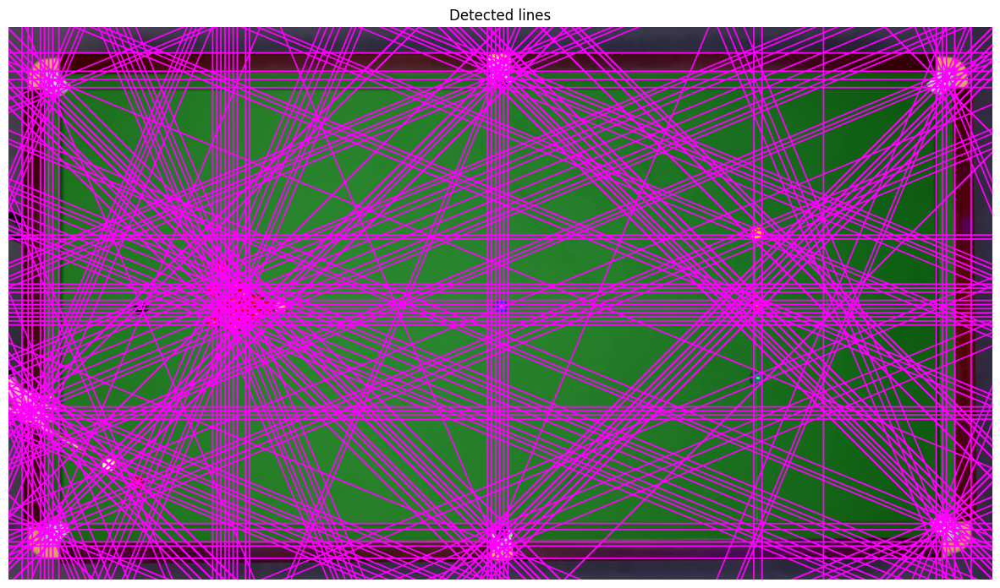

In [11]:
lines = cv2.HoughLines(edges, rho=4, theta=np.pi / 8, threshold=100)
display_lines(mcgill2, lines)

duże pi

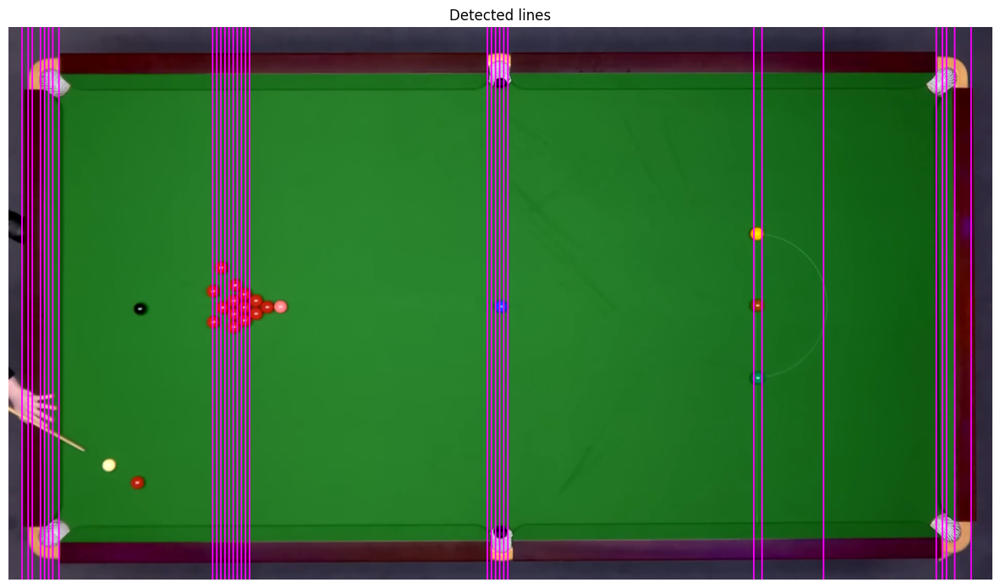

In [12]:
lines = cv2.HoughLines(edges, rho=4, theta=np.pi, threshold=100)
display_lines(mcgill2, lines)

Najfajniejszy wynik - posiadamy jedynie dwie nadmiarowe linie poziome na górnej bandzie oraz jedną na dolnej.

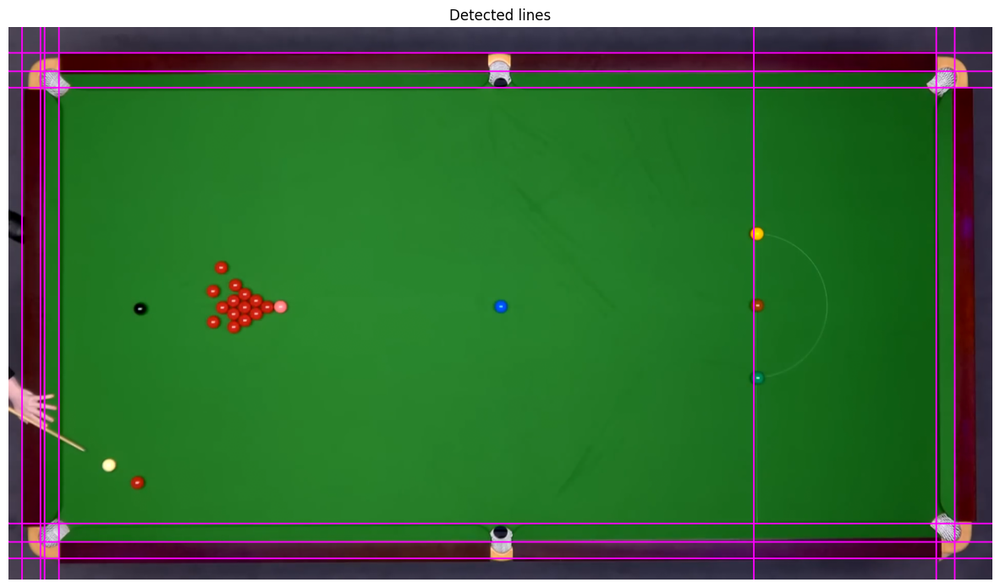

In [13]:
best_lines = cv2.HoughLines(edges, rho=4, theta=np.pi / 2, threshold=650)
display_lines(mcgill2, best_lines)

## Rysujemy kółeczka!

za duży threshold

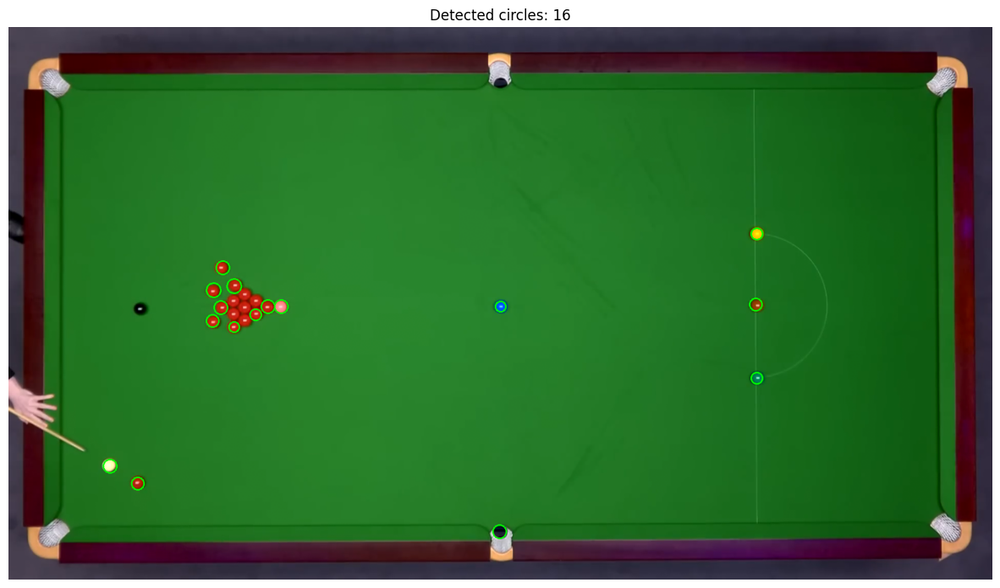

In [14]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=20,
    param1=10,
    param2=20,
    minRadius=9,
    maxRadius=16,
)

display_circles(mcgill2, circles)

za mały threshold

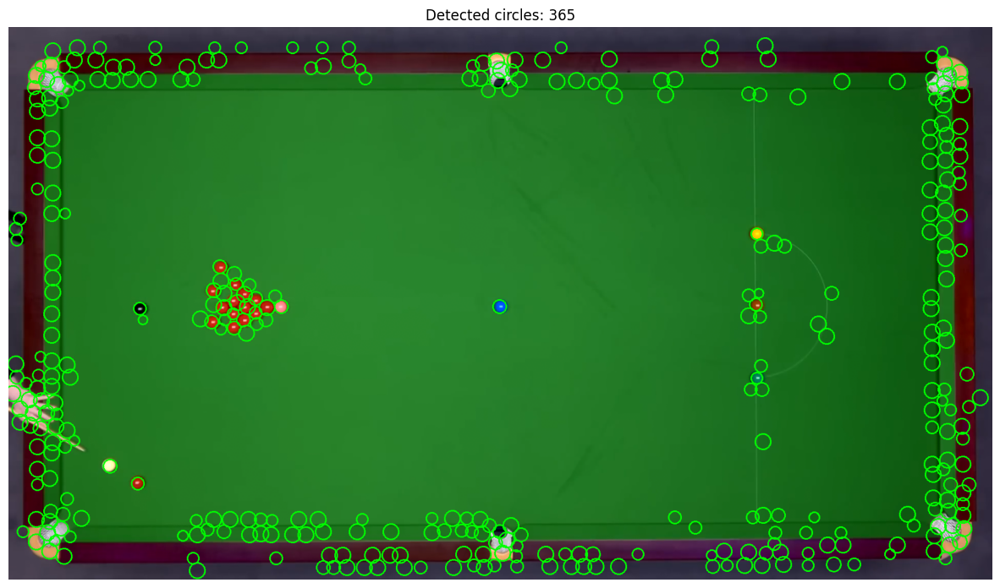

In [15]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=20,
    param1=10,
    param2=5,
    minRadius=9,
    maxRadius=16,
)

display_circles(mcgill2, circles)

zmniejszająć dp czyli rozdzielczośc o połowe

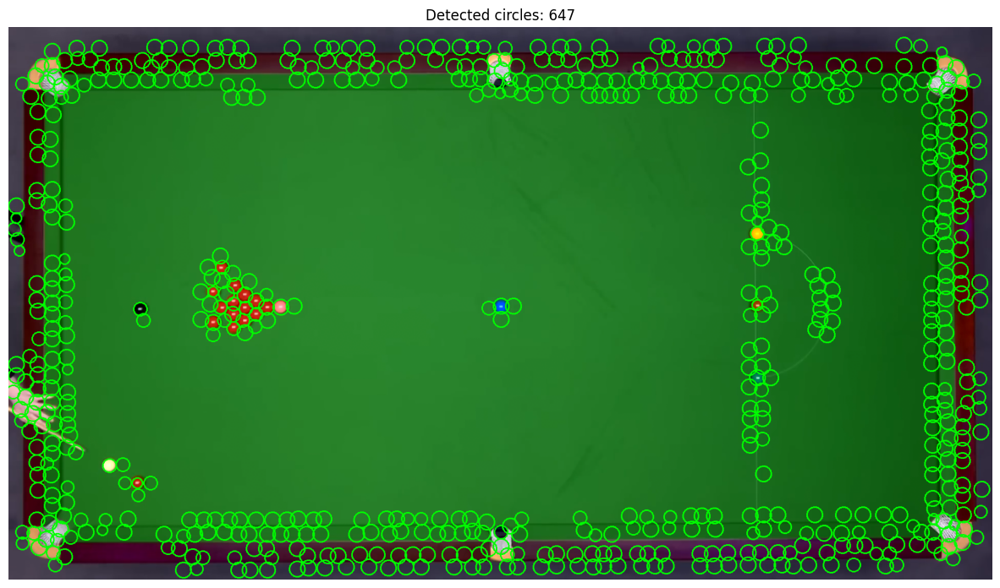

In [16]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=2,
    minDist=20,
    param1=10,
    param2=13,
    minRadius=9,
    maxRadius=16,
)

display_circles(mcgill2, circles)

przy da dużym skupione w jednym miescu bile nie są wykrywane

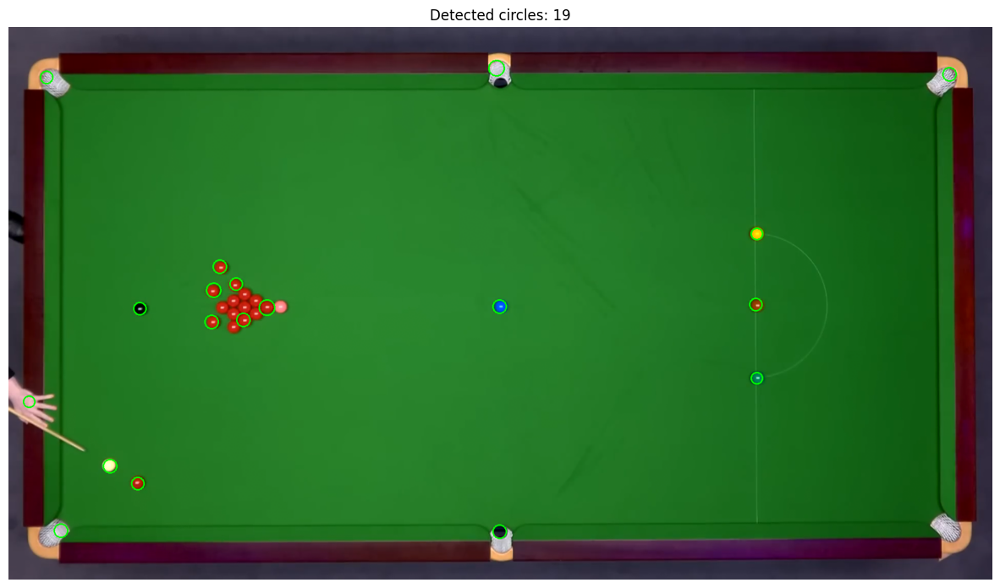

In [17]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=40,
    param1=10,
    param2=13,
    minRadius=9,
    maxRadius=16,
)

display_circles(mcgill2, circles)

za mały dystans

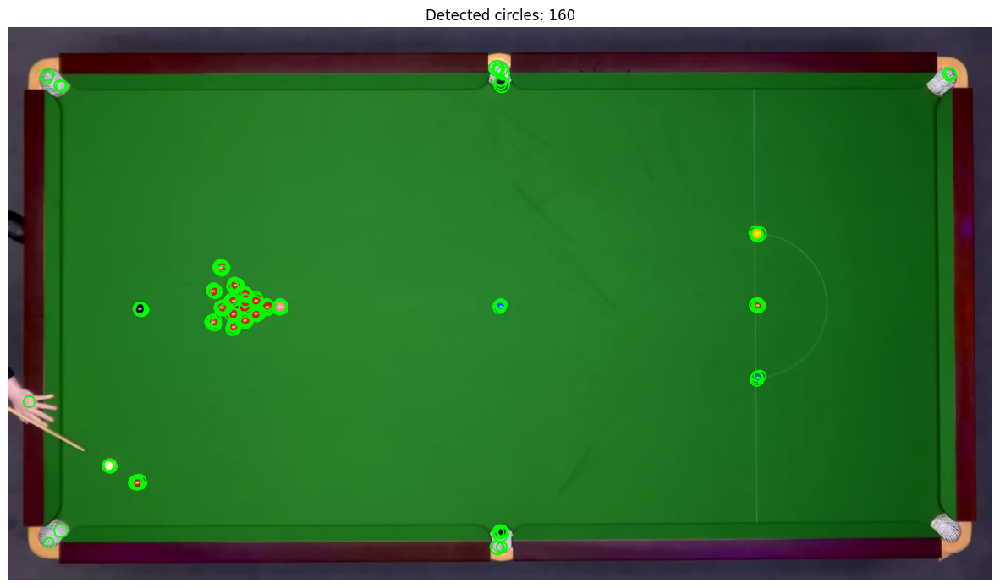

In [18]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=2,
    param1=10,
    param2=13,
    minRadius=9,
    maxRadius=16,
)

display_circles(mcgill2, circles)

najelpsze

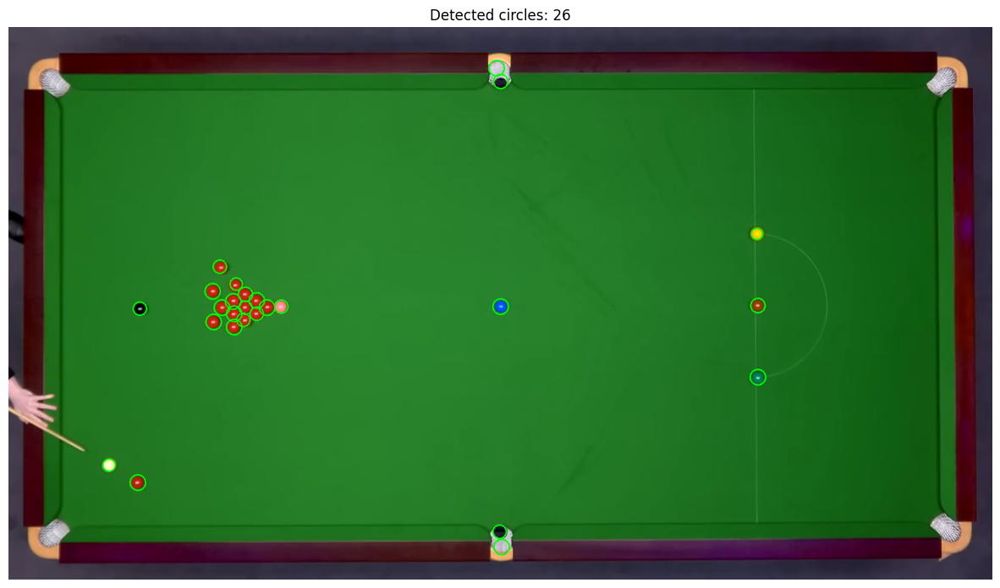

In [19]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=20,
    param1=10,
    param2=14,
    minRadius=10,
    maxRadius=16,
)

display_circles(mcgill2, circles)

## Usuwanie nadmiernych linii

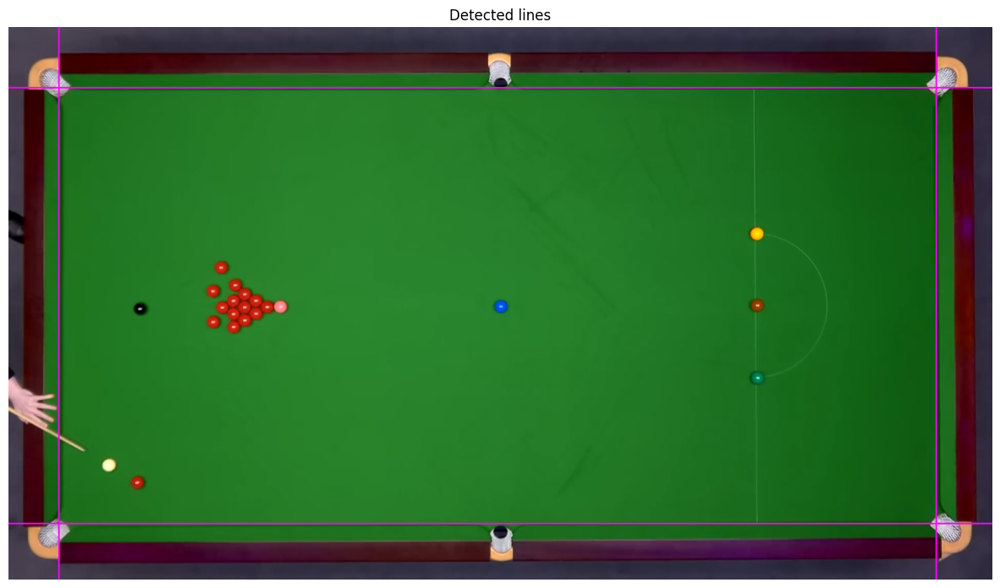

In [20]:
best_lines = cv2.HoughLines(edges, rho=4, theta=np.pi / 2, threshold=790)
best_lines_filtered = extract_inner_edges(best_lines, image=mcgill2)
display_lines(mcgill2, best_lines_filtered)

## Usuwanie nadmiernych kółeczek

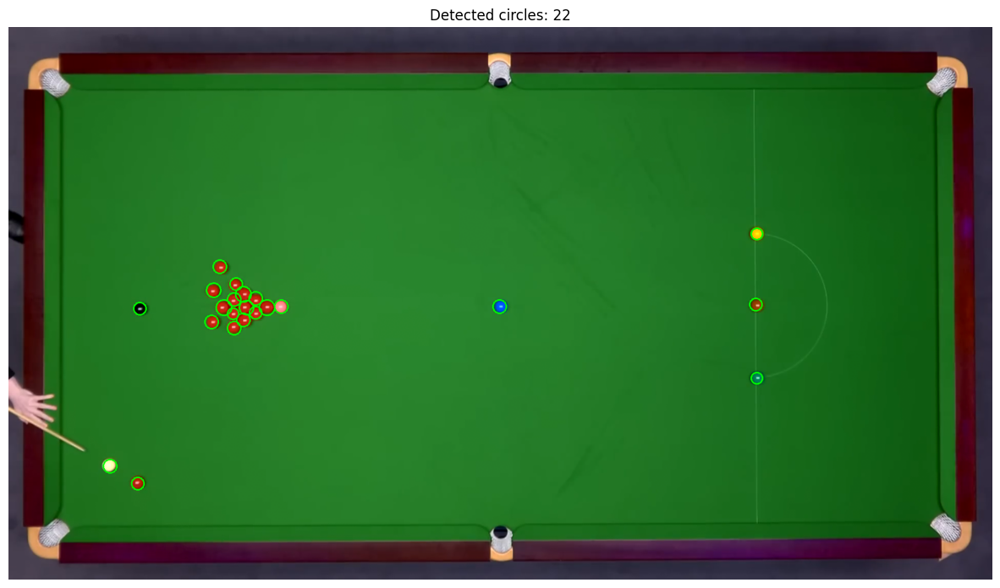

In [21]:
circles = cv2.HoughCircles(
    edges,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=20,
    param1=10,
    param2=13,
    minRadius=9,
    maxRadius=16,
)

circles_filtered = filter_circles_within_edges(circles, best_lines_filtered)

display_circles(mcgill2, circles_filtered)

## Finalny efekt

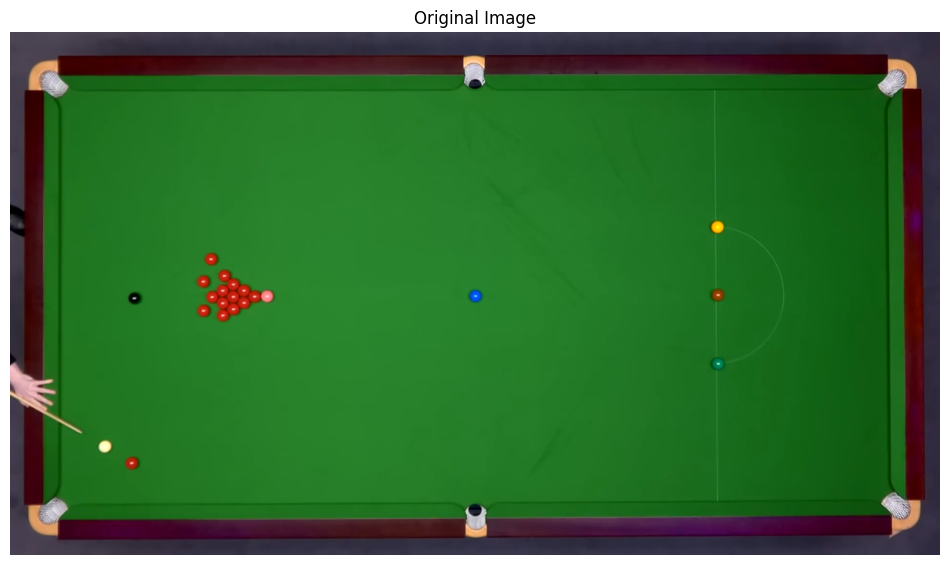

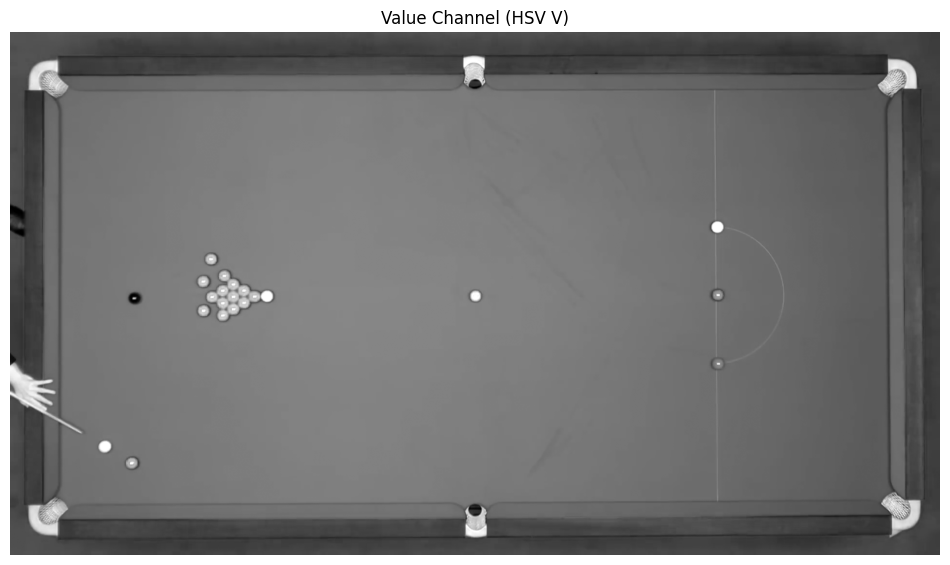

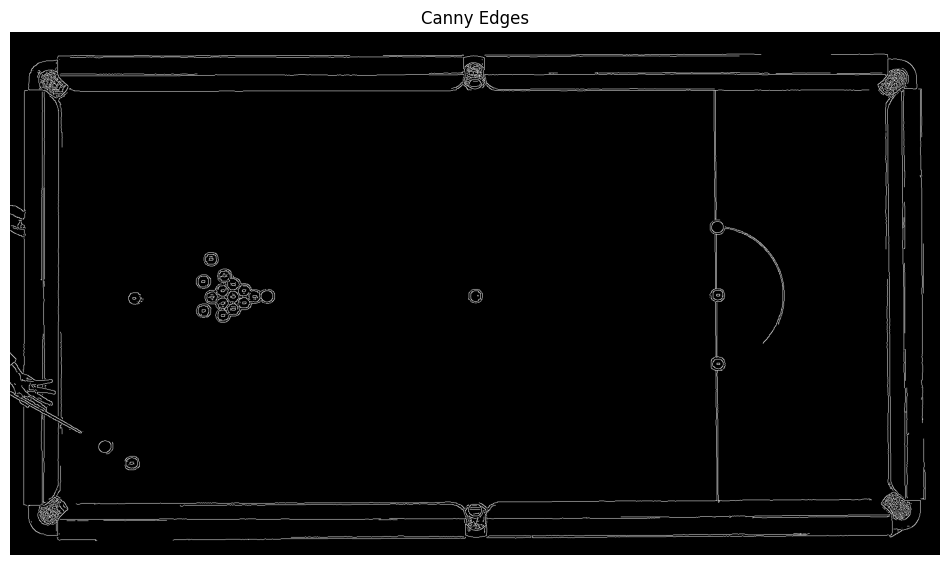

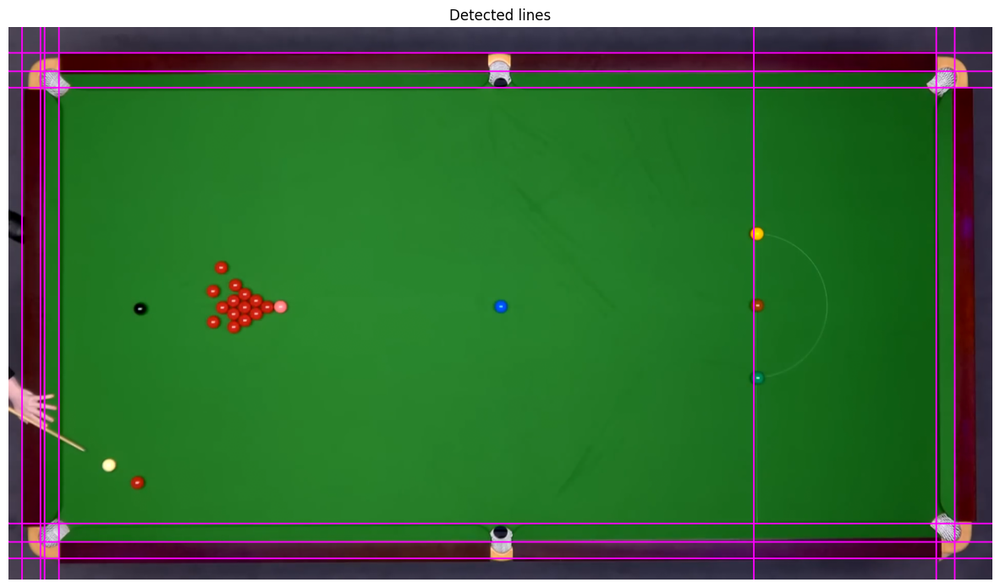

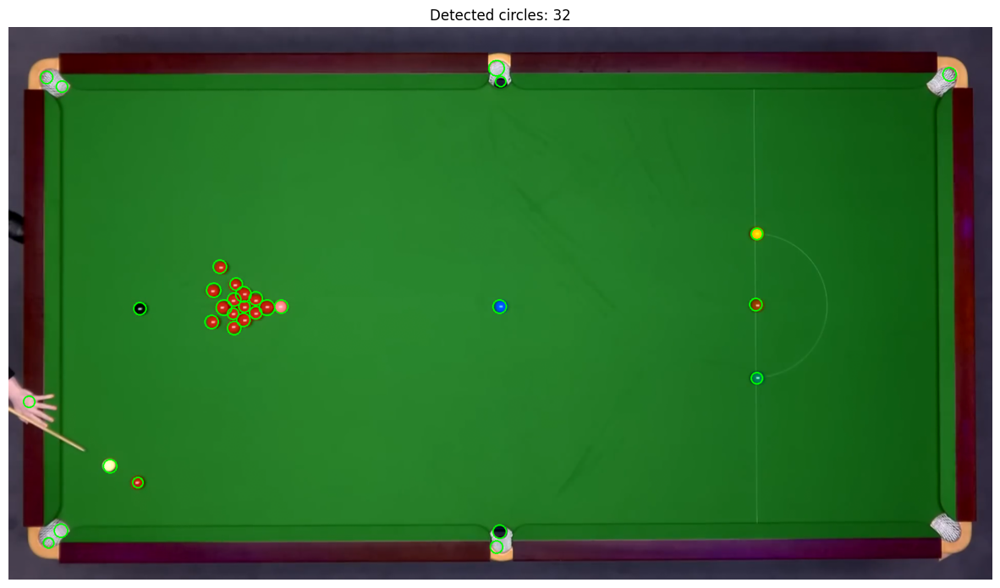

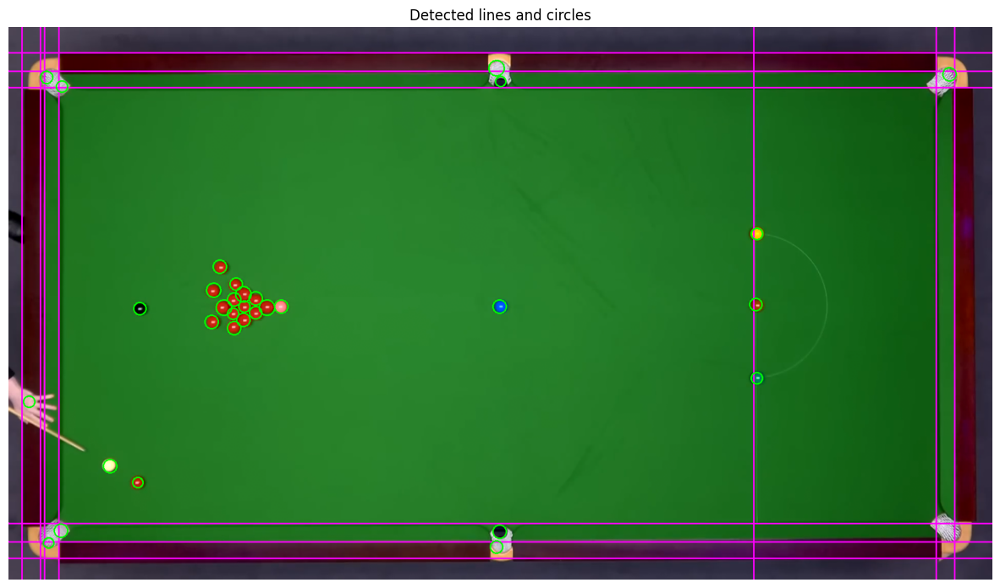

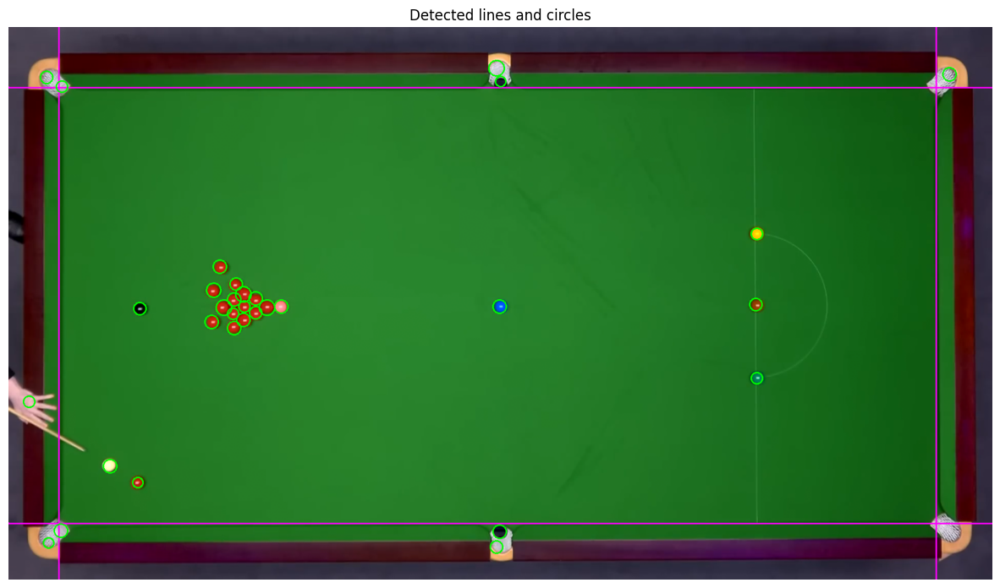

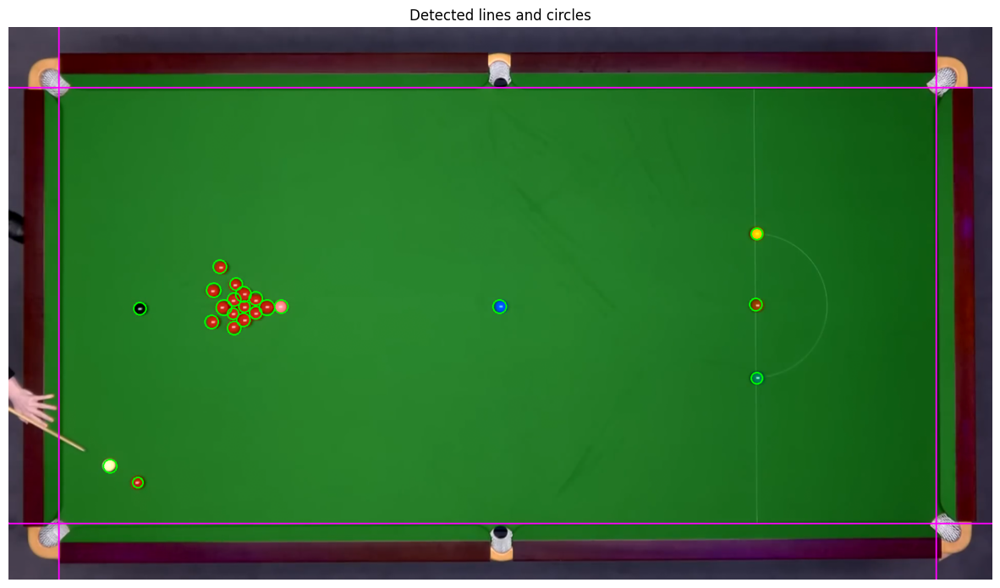

In [22]:
process_image(mcgill2)

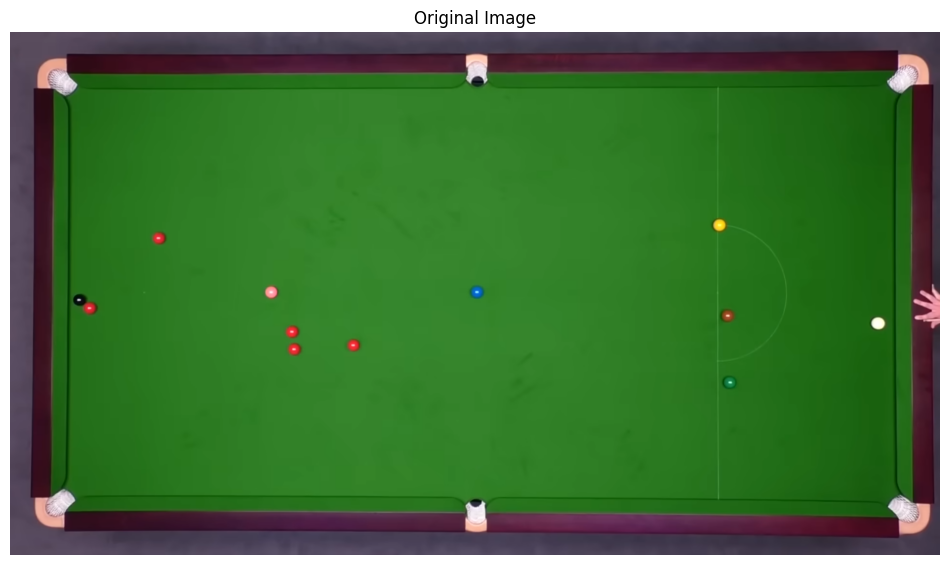

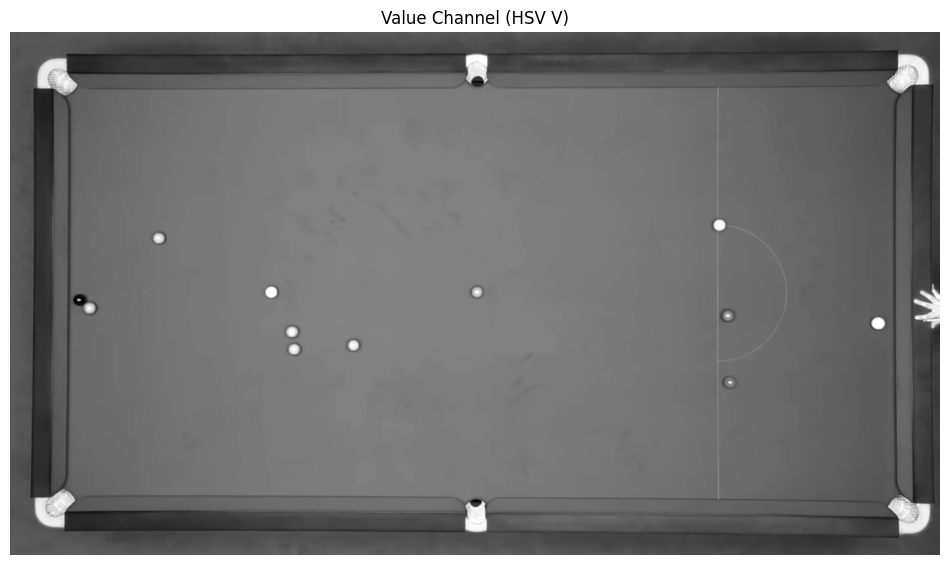

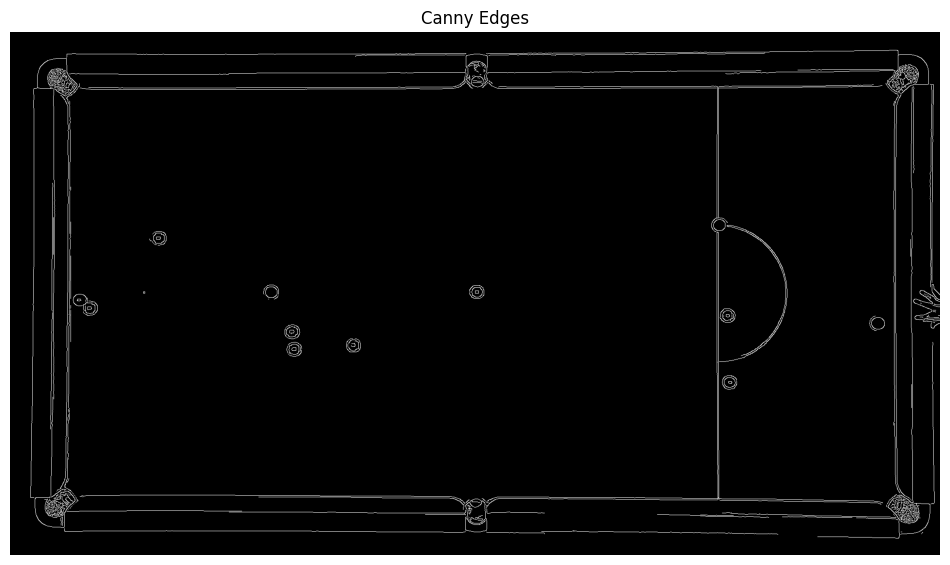

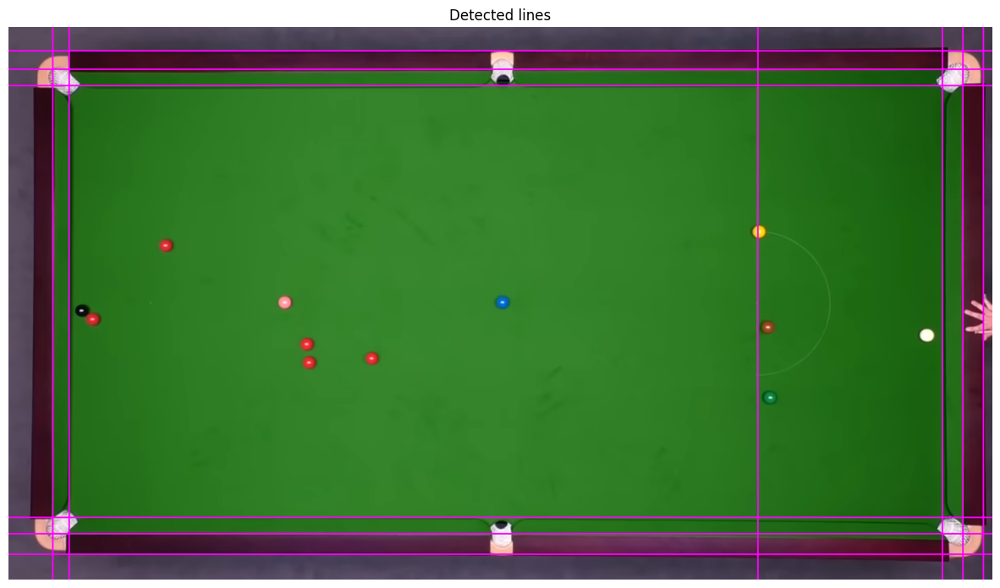

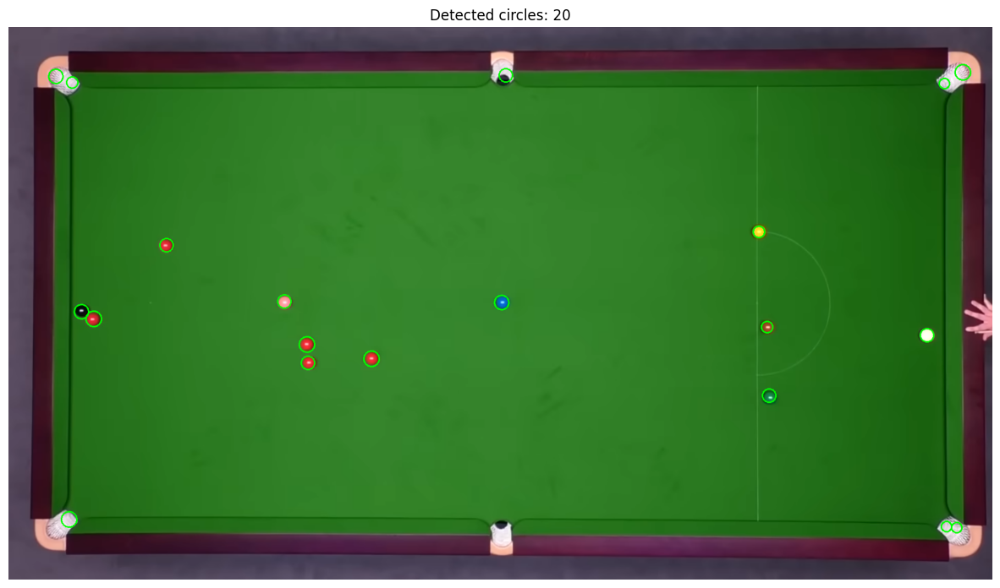

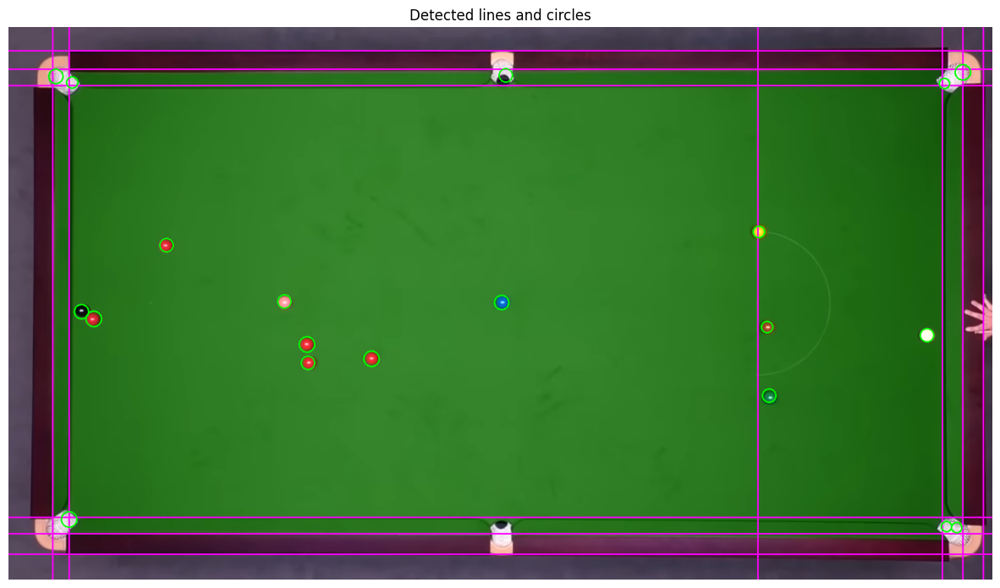

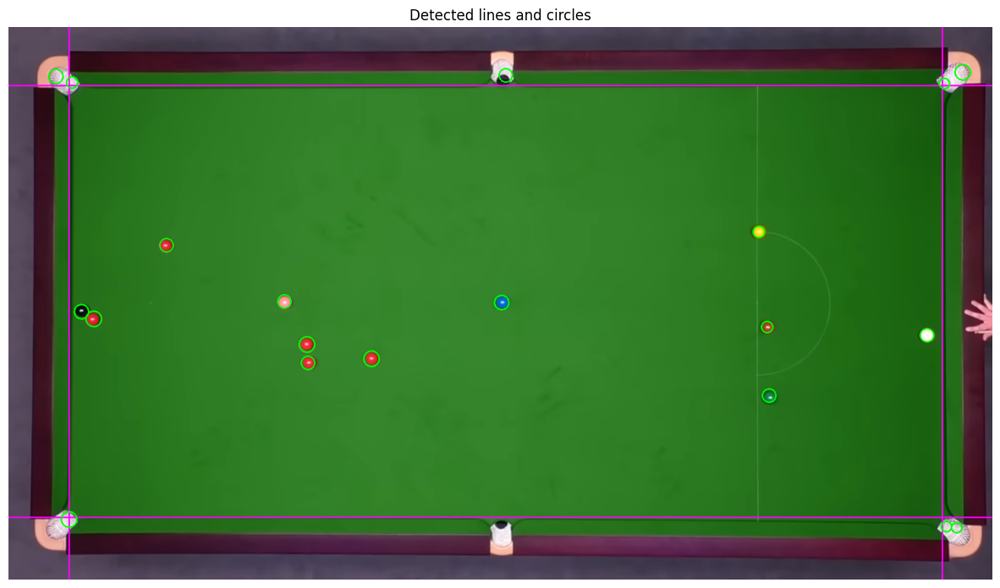

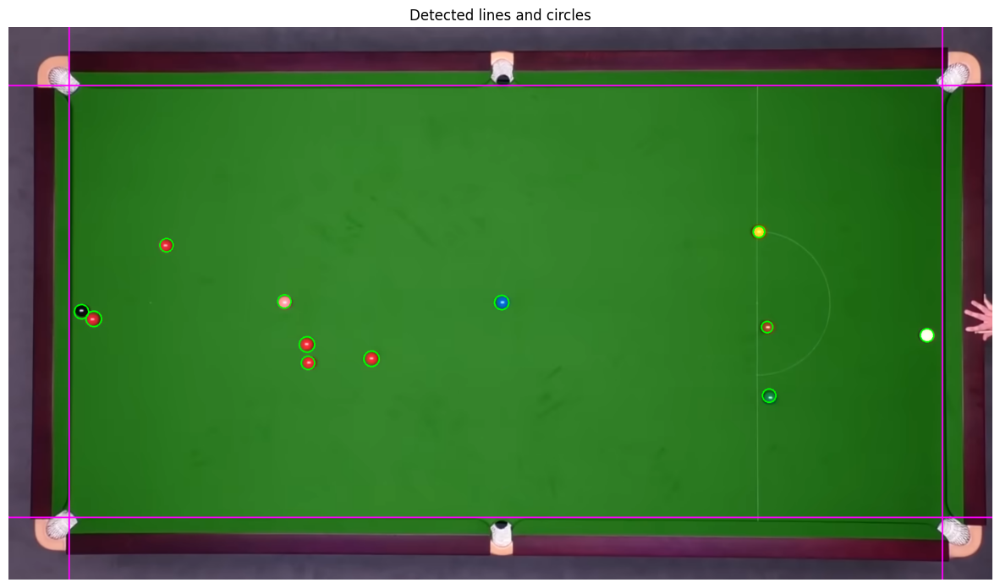

In [24]:
process_image(trump)

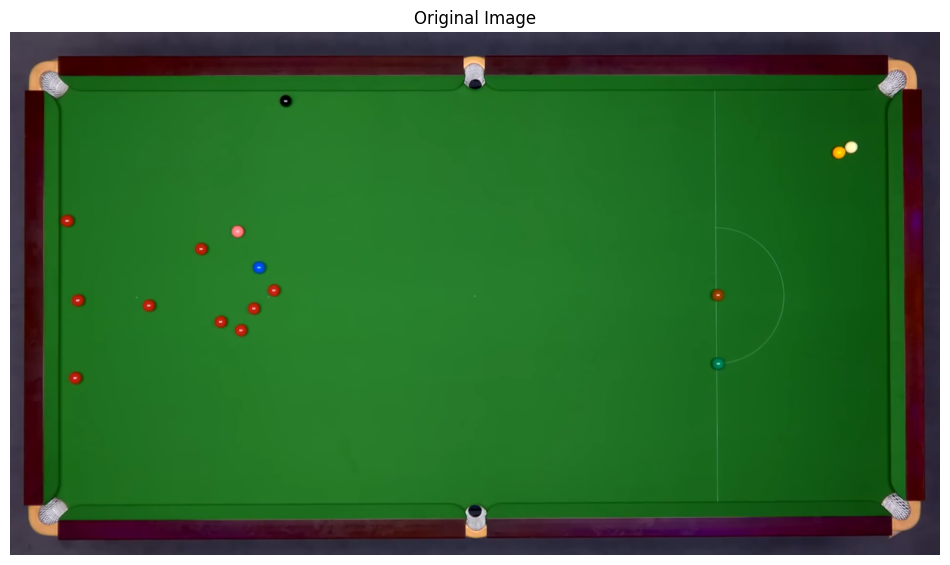

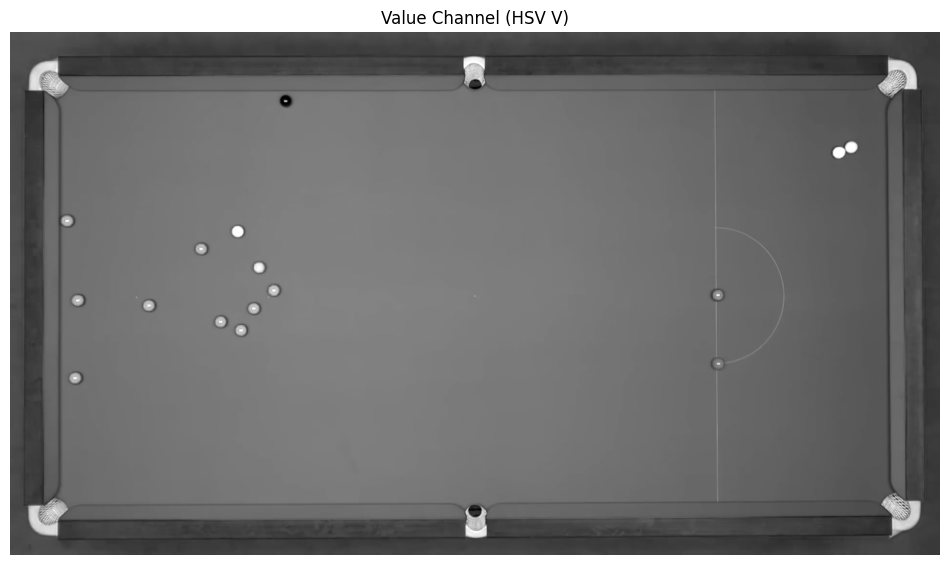

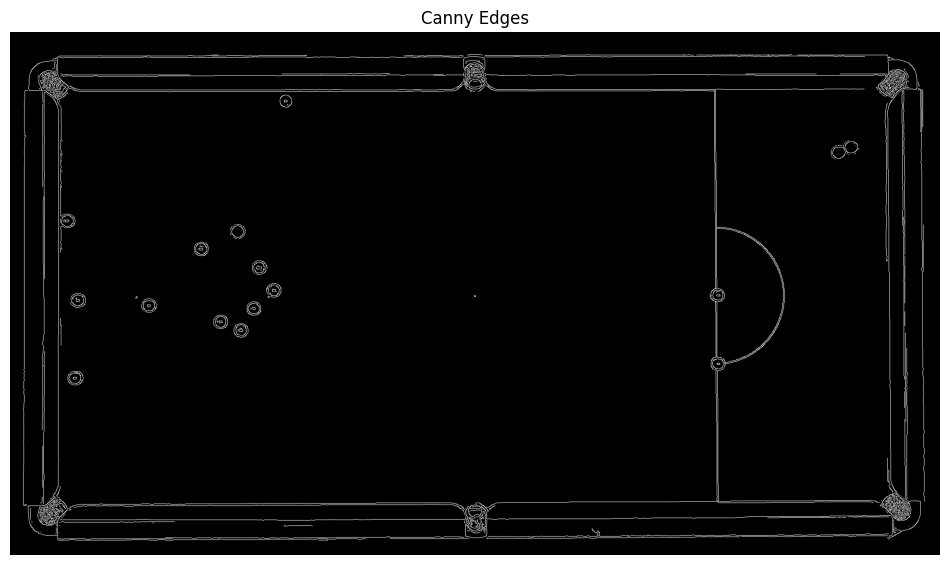

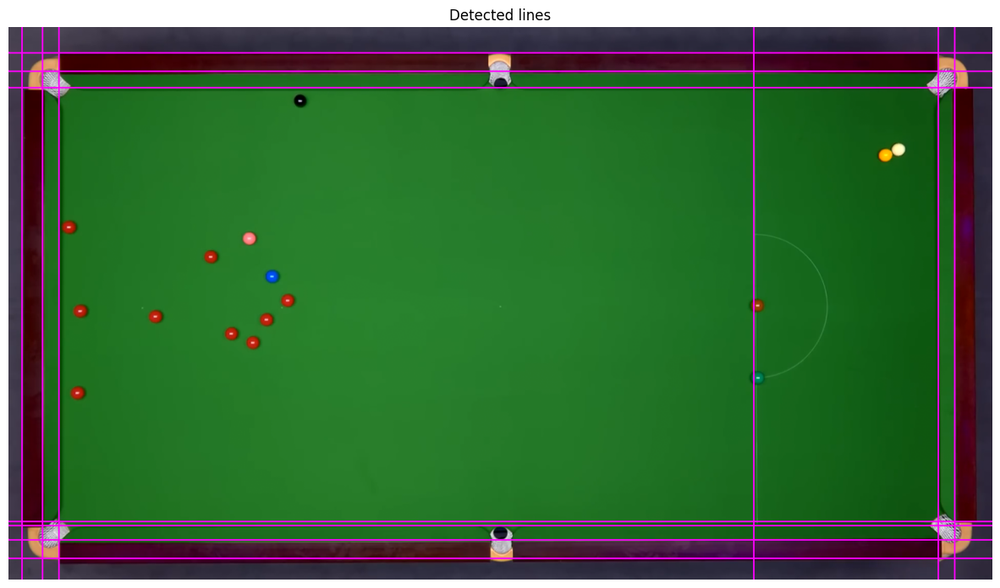

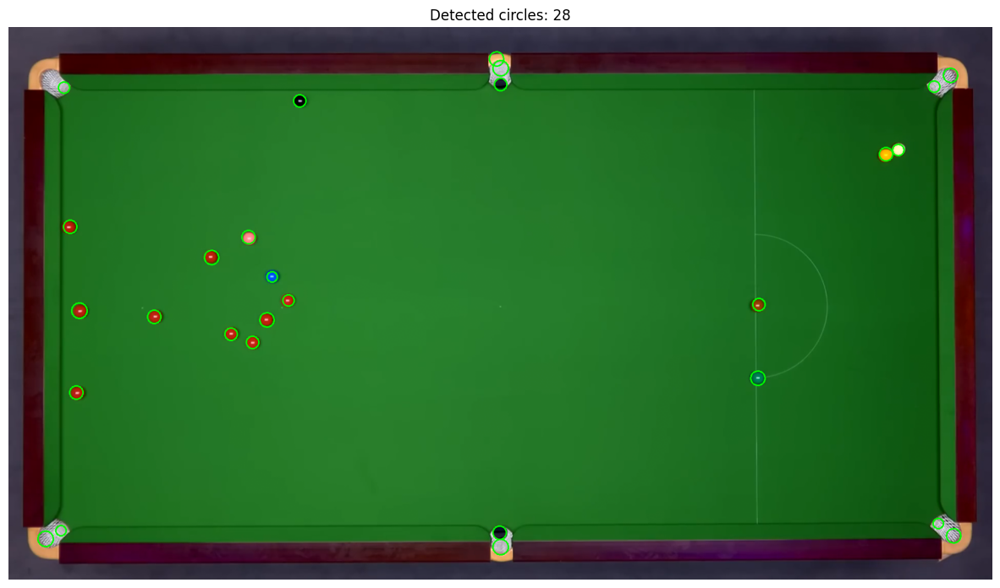

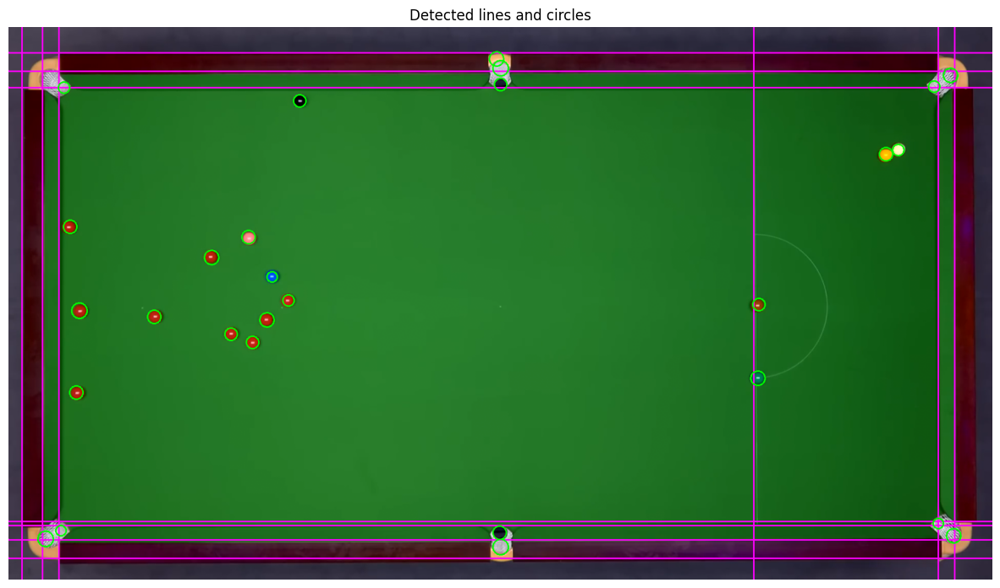

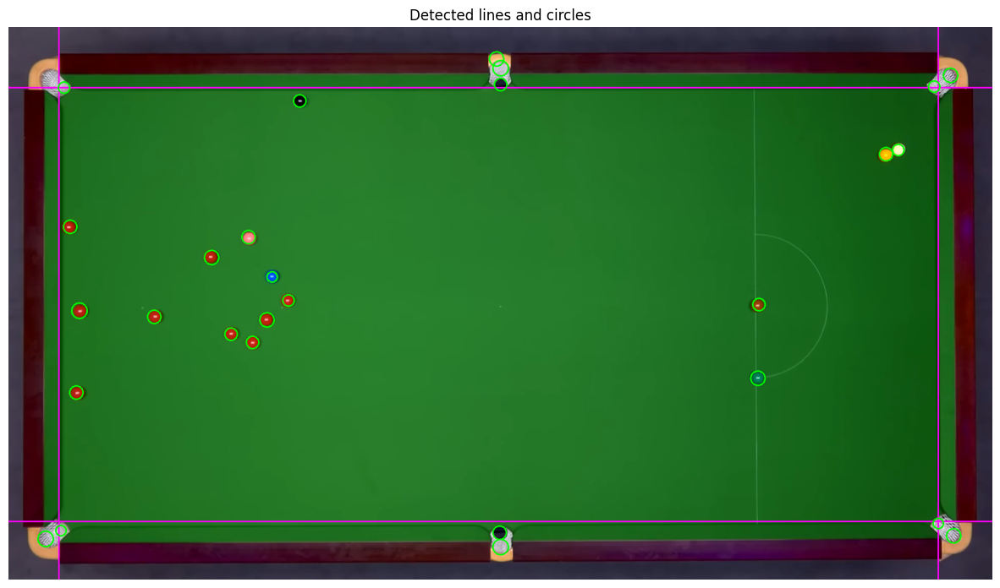

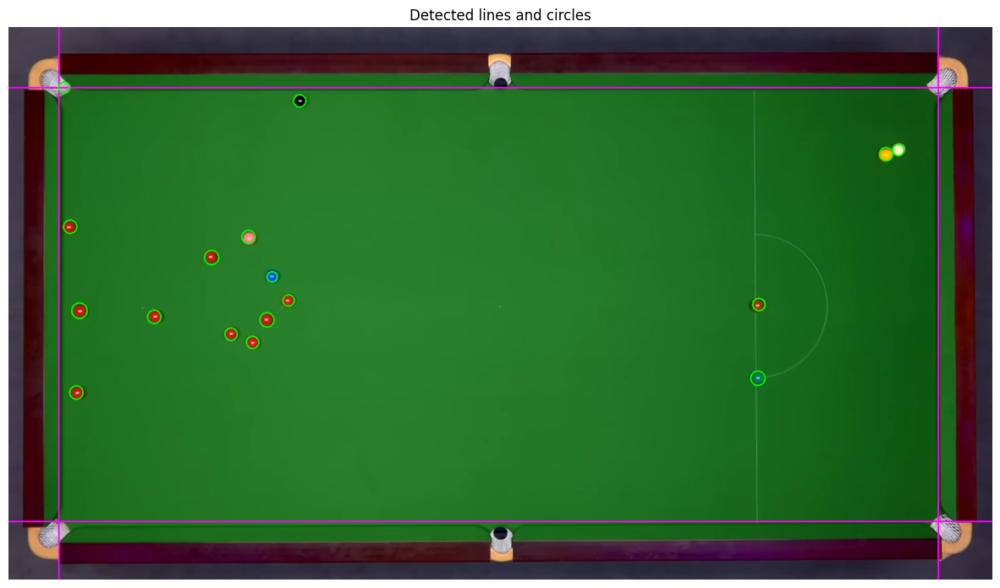

In [27]:
process_image(mcgill)

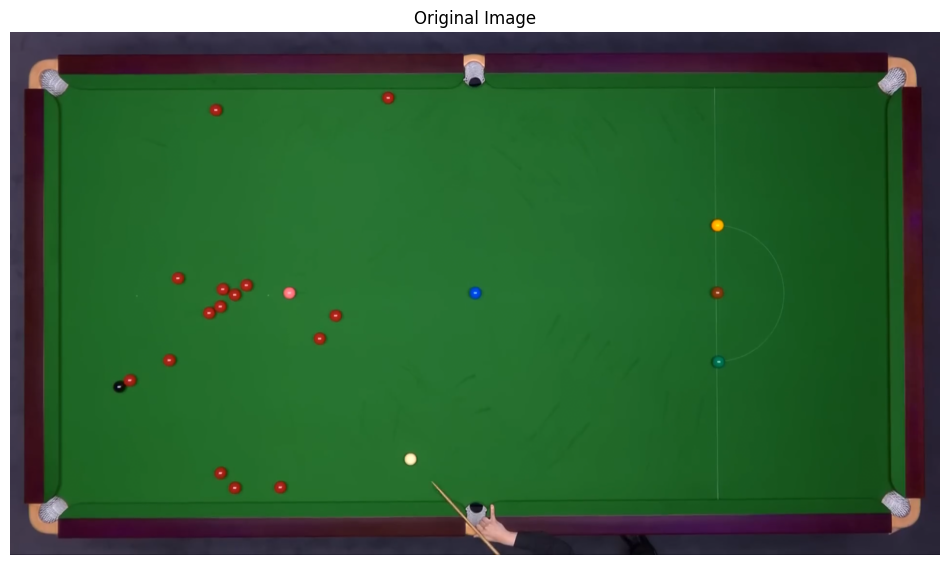

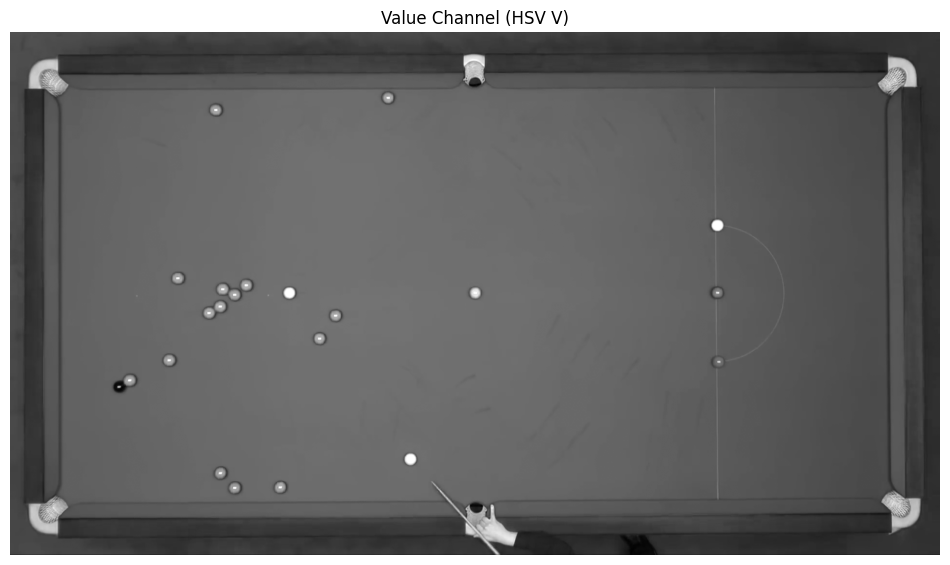

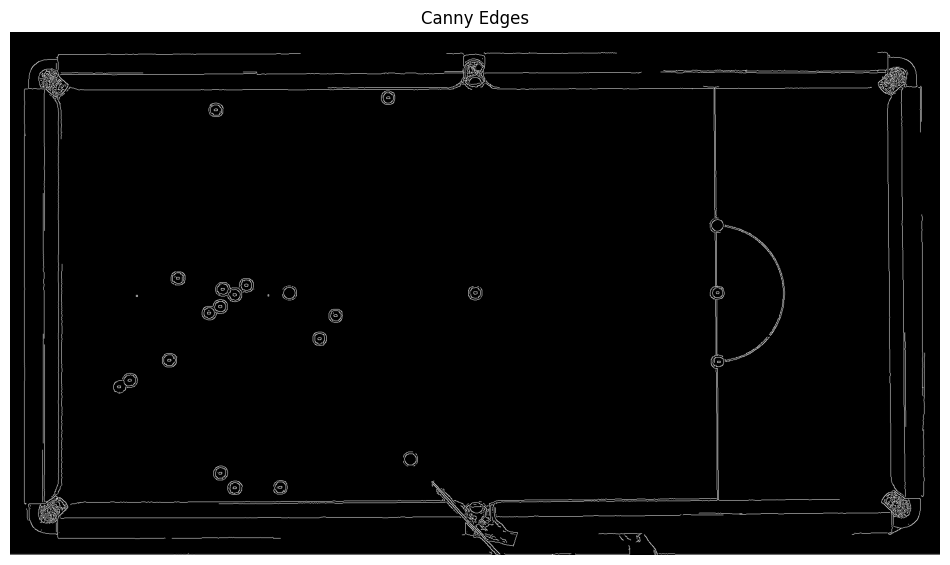

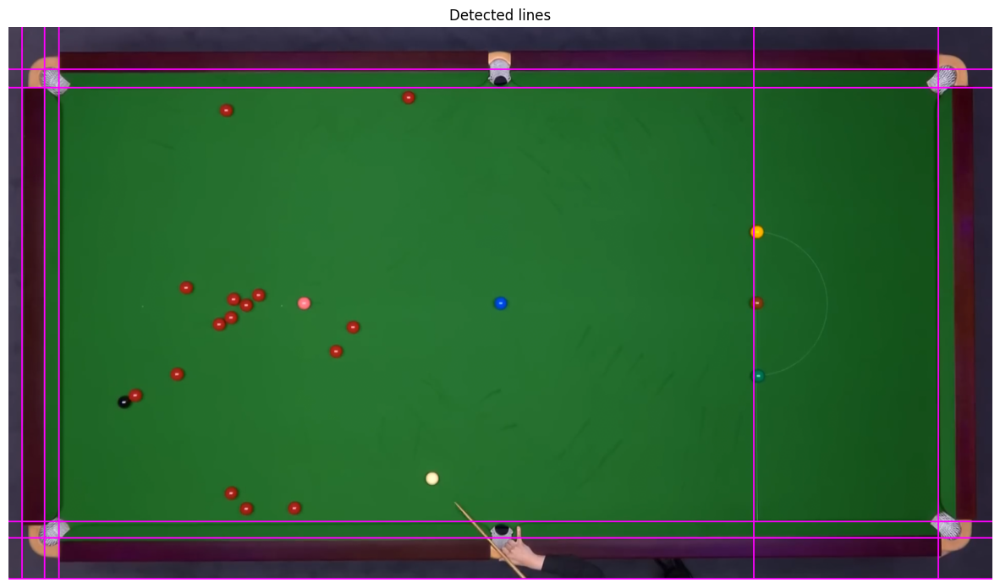

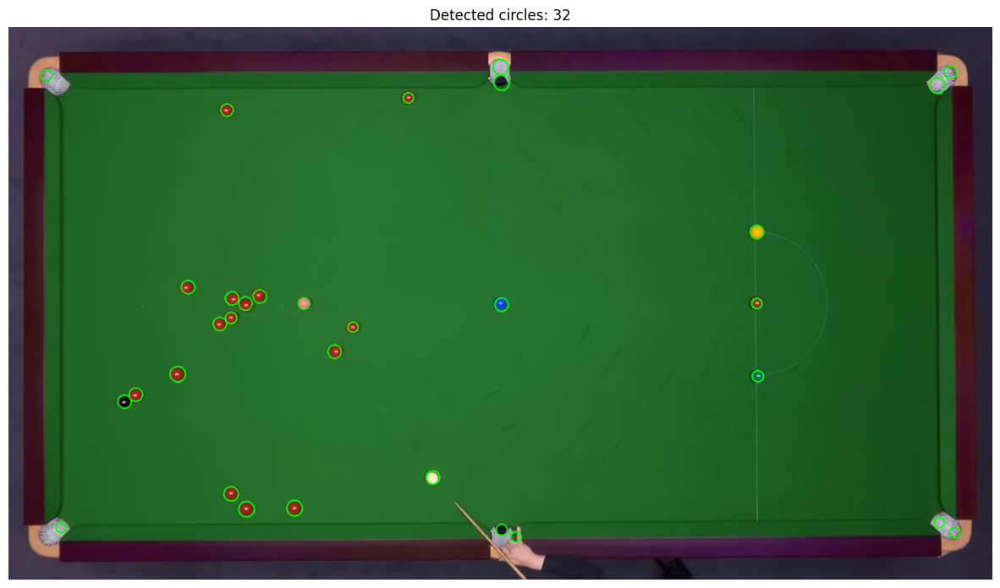

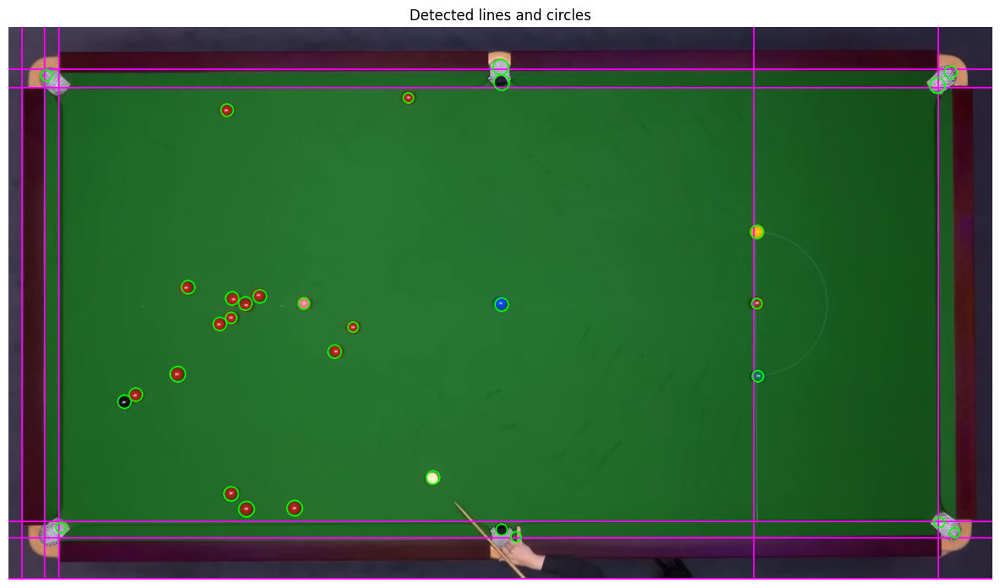

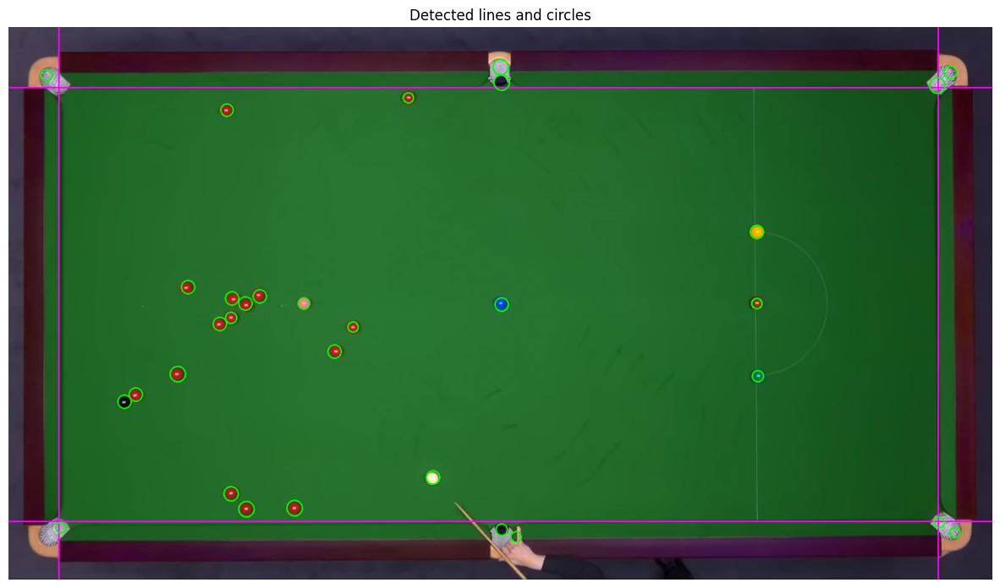

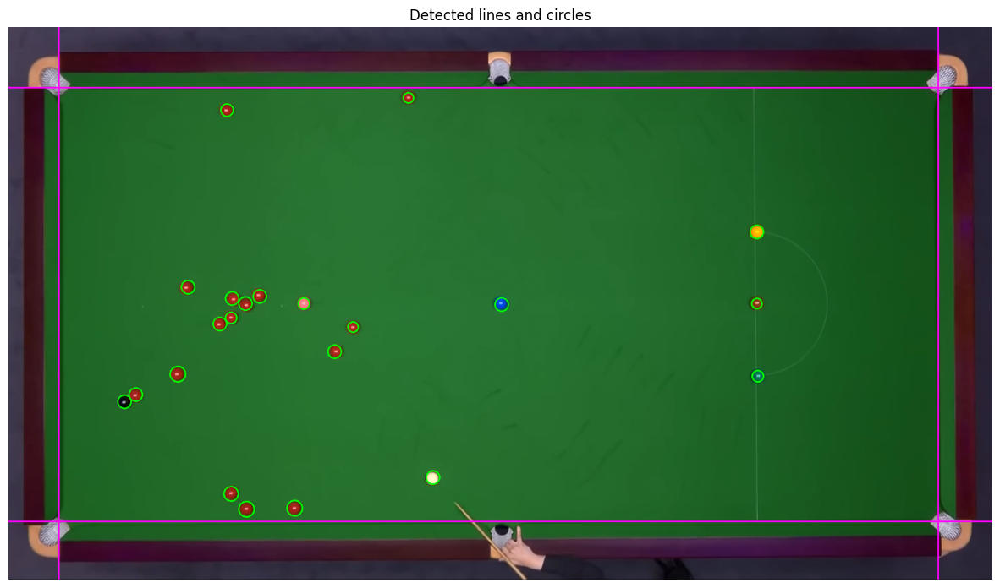

In [25]:
process_image(zhao)